# Methods (pre DESeq2 analysis)

Using our RNA-seq data, we first quantified the abundance of transcripts using the program kallisto.  [Runs are located at /n/home08/leking/20151019Sackton/KallistoAnalysis/KallistoAnalysisNoMitochondrialTranscripts on Odyssey] The first step was to make a transcriptome index using a transcriptome file (ftp://ftp.flybase.net/genomes/Drosophila_melanogaster/current/fasta/dmel-all-transcript-r6.07.fasta.gz).  Using this transcriptome index and our single-end reads, we were then able to quantify the abundances of transcripts for each strain.  In calculating the abundances of transcripts, we used the following parameters for each strain: the average fragment length for that strain [from RNAseq_cDNAlibraries_Lene.xlsx file sent by e-mail 11/9/15], 30 as an estimate of the standard deviation for each strain, and 100 bootstrap samples.

We found that many mitochondrial transcripts were present at very high levels.  As they were not relevant to our analysis, we removed them.  

After running kallisto, we obtained transcripts per million (tpm) data for each strain of Drosophila.  Analysis of the number of gene transcripts that were not detected showed strain Zi238_C4 as a clear outlier, with too many undetected transcripts [Analysis in 20151027_EDA.ipynb].  We removed this strain from our data.  

We then used the library DESeq2 in R for differential expression analysis (see below). 

# Results

A LRT test preferred the reduced model `expression ~lines + tissue + lines:tissue` to the one that included `lane`.  We also showed that if we remove `lane` from our analysis, the p-values don't change very much (correlation of .85 conditioning on carcass data, and .90 conditioning on testes data).  [See: 20160122_IR_Testing_Lane.ipynb]  The biggest differences in gene expression are due to tissue type (carcass vs testes) (See <a href='#CarcassVsTestesHeatmap'>CarcassVsTestesHeatmap</a> and <a href='#CarcassVsTestesPCA'>CarcassVsTestesPCA</a> [though these graphs would ideally need a variance stabilizing / rlog transformation applied -- we probably woudn't want it to be blind, but conditional on tissue]).  In fact, the differences between tissues were so great that we decided it was more conservative to analyze carcass and tissue data separately.  Analyzing tissues separately leads to significantly less genes being labeled as differentially expressed (463+150-6=607 vs 2574). (See <a href='#CarcassTestesCombinedLRT'>CarcassTestesCombinedLRT</a>).

Conditioning on carcass data, we find 463 statistically significantly differerentially expressed genes per line using the simple model with only `lines` as an independent variable (See <a href='#CarcassLRT1'>CarcassLRT1</a> and <a href='#CarcassLRT'>CarcassLRT</a> for code).  We define statistical significance to be all transcripts with an adjusted p-value <.05.  Analysis of testes data did not show the same level of differential expression by line, with only 150 statistically significant genes (See <a href='#TestesLRT1'>TestesLRT1</a> and <a href='#TestesLRT'>TestesLRT</a> for code).  

Pairwise comparisons using a LRT (with the comparison `lane1 vs lane2` as a control) reveal that Zi257 is very different from Zi238 in carcass data, and to some extent from Fr188 and Fr89. All other comparisons show much smaller numbers of differences.  We don't see very much signal when we do pairwise comparisons in carcass data [See: 20160122_IR_Testing_Lane.ipynb].  A heatmap and PCA plot of the carcass data also reveal that inter-population variation of gene expression is not greater than intra-population variation (See <a href='#CarcassPCA'>CarcassPCA</a>,<a href='#CarcassPCArlog'>CarcassPCA</a>, <a href='#heatmapC'>heatmapC</a>, <a href='#heatmapCrlog'>heatmapCrlog</a>, <a href='#heatmapCvst'>heatmapCvst</a>). This holds even when a regularized log transformation, or a variance stabilizing transformation, is applied. 

For testes data, we did the same analysis, and again see no country effect (See  <a href='#TestesPCA'>TestesPCA</a>, <a href='#TestesPCArlog'>CarcassPCA</a>, <a href='#heatmapT'>heatmapT</a>, <a href='#heatmapTrlog'>heatmapTrlog</a>, <a href='#heatmapTvst'>heatmapTvst</a>).  [The rlog visualizations are best.]  Again we see between country samples are more closely related to each other than within country samples, though the pattern of affinities is different than in the carcass data.

In order to further show that inter-population variation is not greater than intra-population variation, we bootstrap our most differentially expressed genes by line 10000 times.  We then restrict our analysis to only pairs of lines (e.g. Fr188 vs Fr89; Fr188 vs Zi257; etc ... ), and run k-means clustering with `k=2`.  We calculate the accuracy of the clustering algorithm in separating lines of same and of different countries, and find that our analysis clearly separates the two Zimbabwean strains more than any other pair of lines.  Because k-means is based off of Euclidean distance, it is useful to consider transforming the counts beforehand using a regularized log transformation, or a variance stabilizing transformation.  When the count data is transformed, the same conclusions hold.  (See <a href='#CrlogBootstrap'>CrlogBootstrap</a>, <a href='#TrlogBootstrap'>TrlogBootstrap</a>).

Because there are not many SNPs in the Zimbabwe population (Larracuente and Clark, 2013), we can attribute differences in gene expression to other kinds of muational events (for example differences in the number of repetitive elements).  

We compare the statistically significant genes found in the analysis of carcass data, with those described in the meta-analysis of Sackton and Hartl (2013).  To do this, we first convert the transcripts into unique gene IDs using the converter at: http://flybase.org/static_pages/downloads/IDConv.html.  We also update the gene IDs used in the meta-analysis.  A Fisher's exact test reveals that there is significant overlap between the differentially expressed genes per line found in our experiment, and those exhibiting Y-regulatory variation as described in the meta-analysis in Sackton and Hartl (2013) (p-value <.001) (See <a href='#FishersExactTest'>FishersExactTest</a>). 

The next step is to see whether the differentially expressed genes we find in this analysis correlate with those that bind to the DAM protein, pointing to a mechanism as to how the Y chromosome affects gene expression in the autosomes.

# Issues in my analysis


1.  When comparing significant genes in our analysis to those in the GBE analysis, we run into a couple of problems.  Our adjusted p-values are probably not right.  Indeed, we considered the genes that were significant out of a much wider range of genes than in the GBE dataset.  Also, some genes needed to be updated, so again this would affect our p-values.  I think the point though was just to show that we are finding reasonable candidates, which based on the Fisher's exact test, it seems like we are.

2.  In 20160122_IR_Testing_Lane.ipynb, the scatterplot of p-values with and without lane is an arc, not a line, in the carcass data.

3. Some questions about what the best way to show no country effect (PCA? boostrap clusters? distance matrix? heatmap?  covariance matrix?)

4. Did not end up doing an MDS, because PCA with rlog pretty neatly separates clusters.  Maybe I should do MDS?

# DESeq2 Differential Expression Analysis

## Importing libraries, importing and formatting Kallisto data and condition information

In [68]:
#From:http://software.rc.fas.harvard.edu/ngsdata/workshops/2015_March/DESeq2_fruitfly.html
suppressWarnings(library('ggplot2'))
suppressWarnings(library('DESeq2'))
library('RColorBrewer')

Grabbing files from Kallisto run (as described in methods).  Note that we remove strain Zi238_C4, which had too many undetected transcripts.


In [69]:
base_dir <- "~/Desktop/KallistoFiles/results2"
sample_names1<-list.files(base_dir)
sample_names1<-sample_names1[sample_names1!="Zi238_C4_AGTTCC"]  #We remove strain Zi238_C4, as there were too many tpms = 0
sample_names<-gsub('.{7}$', '', sample_names1)
kal_dirs <- sapply(sample_names1, function(id) file.path(base_dir, id))

We create a dataframe called `countData` to store the tpms (converted to integers) from these files.   `countData` rows are transcript ids, columns are particular strain and replicate (e.g. Fr89_C2).  In this table, there are 30433 rows, corresponding to the number of transcript ids, and 25 columns, corresponding to the different strains/replicates.

In [70]:
#variable countData: all of the tpm info for all of the Kallisto files, rounded to integers.
countData <- as.character(read.table(file.path(kal_dirs[1], "abundance.tsv"), header = TRUE)$target_id)
for (dir in kal_dirs){
  z<-read.table(file.path(dir, "abundance.tsv"), header=TRUE)
  countData<-data.frame(countData, as.integer(z$est_counts))  #converting to integers
}

#Setting row and column names for countData
colnames(countData)=c("target_id", sample_names)
countData$target_id=read.table(file.path(kal_dirs[1], "abundance.tsv"), header = TRUE)$target_id
rownames(countData)=countData$target_id
countData$target_id=NULL

dim(countData)

[1] 30433    25

We now load conditions file, and display it below.  We store it in the variable `colData`.

In [71]:
#variable colData: All of the conditions information for the different samples

#The conditions dataset is hiseq_infoAll
colData<-read.table("~/Desktop/KallistoFiles/hiseq_infoAll.txt", header=T, stringsAsFactors=FALSE, sep="\t")
colData<-colData[match(colnames(countData), gsub('.{7}$', '', colData$sample)),]

rownames(colData)=gsub('.{7}$', '', colData$sample)
colData$sample = NULL
colData$lane = factor(colData$lane)
colData$lines = factor(colData$lines)

colData

,country,lines,tissue,lane
Fr188_C1,Fr,188,C,1
Fr188_C2,Fr,188,C,2
Fr188_C3,Fr,188,C,1
Fr188_T3,Fr,188,T,1
Fr188_T5,Fr,188,T,2
Fr188_T6,Fr,188,T,2
Fr89_C1,Fr,89,C,2
Fr89_C2,Fr,89,C,2
Fr89_C4,Fr,89,C,1
Fr89_T3,Fr,89,T,1


## DESeq analysis with lane

### Separating testes and carcass data

We found in a preliminary exploratory data analysis that the biggest differences in gene expression are between carcass and testes.  In fact the differences are so big, that we find it more conservative to divide our dataset into carcass data and testes data.


Here we create DESeq object files from our DESeq datasets.

In [72]:
##dataset C -- just carcass data
colDataC<-colData[colData$tissue=='C',]
countDataC<-countData[,colnames(countData) %in% rownames(colDataC)]
datasetC <- DESeqDataSetFromMatrix(countData = countDataC,
                                   colData = colDataC,
                                   design = ~lines)

##dataset T -- just testes data
colDataT<-colData[colData$tissue=='T',]
countDataT<-countData[,colnames(countData) %in% rownames(colDataT)]
datasetT <- DESeqDataSetFromMatrix(countData = countDataT,
                                   colData = colDataT,
                                   design = ~lines)
suppressWarnings(ddsC<-DESeq(datasetC))
suppressWarnings(ddsT<-DESeq(datasetT))

estimating size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
estimating size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing


### LRT to see if line is significant in testes vs carcass data

We do a LRT to see if line is significant, compared to the reduced model.  We see that line has a much smaller effect in the testes data than in carcass data.

<a id='CarcassLRT1'></a> <a id='TestesLRT1'></a>

In [73]:
ddsC.line<-nbinomLRT(ddsC, reduced= ~1)
results.line.C<-results(ddsC.line)
results.line.ordered.C<-results.line.C[order(results.line.C$padj),]
summary(results.line.C)

found results columns, replacing these



out of 28822 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)     : 321, 1.1% 
LFC < 0 (down)   : 440, 1.5% 
outliers [1]     : 409, 1.4% 
low counts [2]   : 4433, 15% 
(mean count < 3)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [74]:
#line test for testes
ddsT.line<-nbinomLRT(ddsT, reduced=~1)
results.line.T<-results(ddsT.line)
results.line.ordered.T<-results.line.T[order(results.line.T$padj),]
summary(results.line.T)

found results columns, replacing these



out of 28486 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)     : 102, 0.36% 
LFC < 0 (down)   : 97, 0.34% 
outliers [1]     : 522, 1.8% 
low counts [2]   : 2202, 7.7% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



## Pairwise comparisons for different lines

For pairwise comparisons with lane as a control, see : 20160122_IR_Testing_Lane.ipynb.  In carcass data, Zi257 most different from Zi238.

In [75]:
print("lines 188 vs 238")
summary(results(ddsC, contrast=c('lines','188','238')), alpha=0.05) #nothing
print("lines 188 vs 89")
summary(results(ddsC, contrast=c('lines','188','89')), alpha=0.05) #nothing
print("lines 188 vs 257")
summary(results(ddsC, contrast=c('lines','188','257')), alpha=0.05) #something
print("lines 257 vs 238")
summary(results(ddsC, contrast=c('lines','257','238')), alpha=0.05) #something bigger
print("lines 257 vs 89")
summary(results(ddsC, contrast=c('lines','257','89')), alpha=0.05) #something 
print("lines 89 vs 238")
summary(results(ddsC, contrast=c('lines','89', '238')), alpha=0.05) #something

[1] "lines 188 vs 238"

out of 28822 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 29, 0.1% 
LFC < 0 (down)   : 12, 0.042% 
outliers [1]     : 1827, 6.3% 
low counts [2]   : 0, 0% 
(mean count < 0)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results

[1] "lines 188 vs 89"

out of 28822 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 8, 0.028% 
LFC < 0 (down)   : 10, 0.035% 
outliers [1]     : 1827, 6.3% 
low counts [2]   : 0, 0% 
(mean count < 0)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results

[1] "lines 188 vs 257"

out of 28822 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 33, 0.11% 
LFC < 0 (down)   : 40, 0.14% 
outliers [1]     : 1827, 6.3% 
low counts [2]   : 1836, 6.4% 
(mean count < 1)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results

[1] "lines 257 vs 238"

out of 2

In [76]:
print("lines 188 vs 238")
summary(results(ddsT, contrast=c('lines','188','238')), alpha=0.05) 
print("lines 188 vs 89")
summary(results(ddsT, contrast=c('lines','188','89')), alpha=0.05) 
print("lines 188 vs 257")
summary(results(ddsT, contrast=c('lines','188','257')), alpha=0.05) 
print("lines 257 vs 238")
summary(results(ddsT, contrast=c('lines','257','238')), alpha=0.05) #biggest effect (still not very big)
print("lines 257 vs 89")
summary(results(ddsT, contrast=c('lines','257','89')), alpha=0.05)  
print("lines 89 vs 238")
summary(results(ddsT, contrast=c('lines','89', '238')), alpha=0.05) 

[1] "lines 188 vs 238"

out of 28486 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 6, 0.021% 
LFC < 0 (down)   : 7, 0.025% 
outliers [1]     : 2239, 7.9% 
low counts [2]   : 11622, 41% 
(mean count < 30)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results

[1] "lines 188 vs 89"

out of 28486 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 9, 0.032% 
LFC < 0 (down)   : 11, 0.039% 
outliers [1]     : 2239, 7.9% 
low counts [2]   : 0, 0% 
(mean count < 0)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results

[1] "lines 188 vs 257"

out of 28486 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 15, 0.053% 
LFC < 0 (down)   : 16, 0.056% 
outliers [1]     : 2239, 7.9% 
low counts [2]   : 539, 1.9% 
(mean count < 0)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results

[1] "lines 257 vs 238"

o

## Combining Carcass and Testes

<a id='CarcassTestesCombinedLRT'></a>

Here we show that if combine carcass and testes data by using the model expression ~ tissue:lines + lines + tissue, we get many more significantly differentially expressed genes (2574 vs 150 +463 -6 = 607).  We therefore see it is more conservative to condition on the different tissues separately, like we did above.

In [77]:
dataset <- DESeqDataSetFromMatrix(countData = countData,
                                          colData = colData,
                                          design = ~lines + tissue+ lines:tissue)
dds<-DESeq(dataset)

dds.line<-nbinomLRT(dds, reduced= ~tissue)
results.line<-results(dds.line)
results.line.ordered<-results.line[order(results.line$padj),]
summary(results.line)

Warning message:
In DESeqDataSet(se, design = design, ignoreRank): some variables in design formula are characters, converting to factorsestimating size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
found results columns, replacing these



out of 29820 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)     : 2276, 7.6% 
LFC < 0 (down)   : 1074, 3.6% 
outliers [1]     : 266, 0.89% 
low counts [2]   : 2874, 9.6% 
(mean count < 2)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [78]:
NoNA<-results.line.ordered[complete.cases(results.line.ordered$padj),]
length(NoNA[NoNA$padj<.05,][,1])

[1] 2574

## Plotting differences

<a id='CarcassLRT'></a>

We do a heatmap on the 463 most differentially expressed genes by lines in the carcass data (all those with p_adj <.05).  We see that Zi238 seems more related to the French strains than to Zi257.  But then again, Fr89_C4 shows up as closely related to the 257 strains.  (The picture was cleaner when we conditioned on lane).

We notice that Fr89_C4, and to some extent Zi238_C2 have a whole bunch of underexpressed genes relative to the other strains.  These are not strains that were flagged by our preliminary analysis in python as having too many zeros (see 20151027_EDA.ipynb).  [The other strain pointed out by the our preliminary analysis in python as having maybe too many zeros was Fr188_T3].  

<a id='heatmapC'></a>

[1] 463

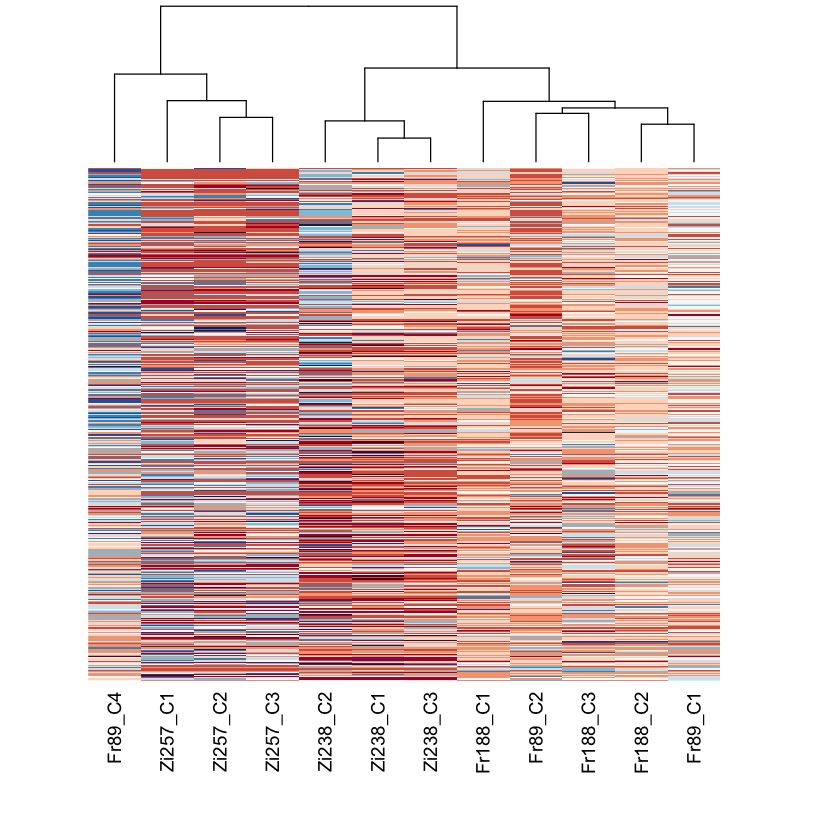

In [79]:
NoNAC<-results.line.ordered.C[complete.cases(results.line.ordered.C$padj),]
length(NoNAC[NoNAC$padj<.05,][,1])

hmcol <- brewer.pal(11,'RdBu')
nCountsC <- counts(ddsC, normalized=TRUE)
heatmap(as.matrix(nCountsC[rownames(results.line.ordered.C)[1:length(NoNAC[NoNAC$padj<.05,][,1])], ]), 
        Rowv = NA, 
        col = hmcol, 
        mar = c(8,2), 
        labRow = "")

Following the advice given in https://www.bioconductor.org/packages/3.3/bioc/vignettes/DESeq2/inst/doc/DESeq2.pdf p.17, we transform the count data for the sake of clustering and visualization.  We use a reguarized log transformation.  This leads to slightly different results, but the conclusion holds that inter-population variation does not trump intra-population variation.

<a id='heatmapCrlog'></a>

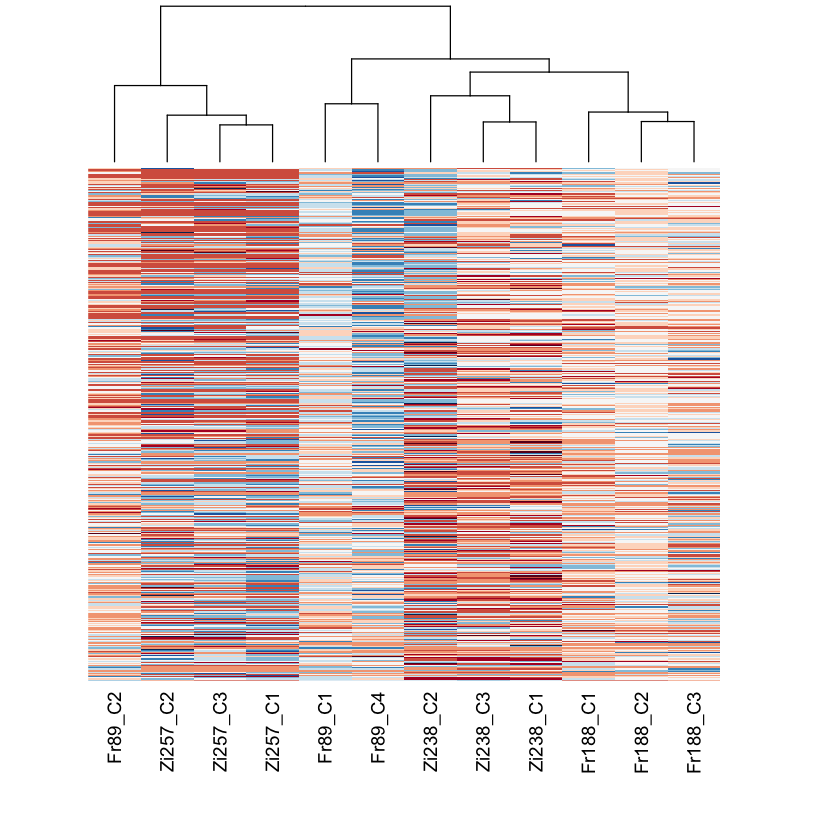

In [130]:
rldC<-rlogTransformation(ddsC, blind=TRUE)

hmcol <- brewer.pal(11,'RdBu')
#nCountsC <- counts(ddsC, normalized=TRUE)
heatmap(as.matrix(assay(rldC)[rownames(results.line.ordered.C)[1:length(NoNAC[NoNAC$padj<.05,][,1])], ]), 
        Rowv = NA, 
        col = hmcol, 
        mar = c(8,2), 
        labRow = "")

By curiosity, and for the sake of completeness, we also do a variance stabilizing transformation and plot the results.  We get the same results as in the raw counts data.
<a id='heatmapCvst'></a>

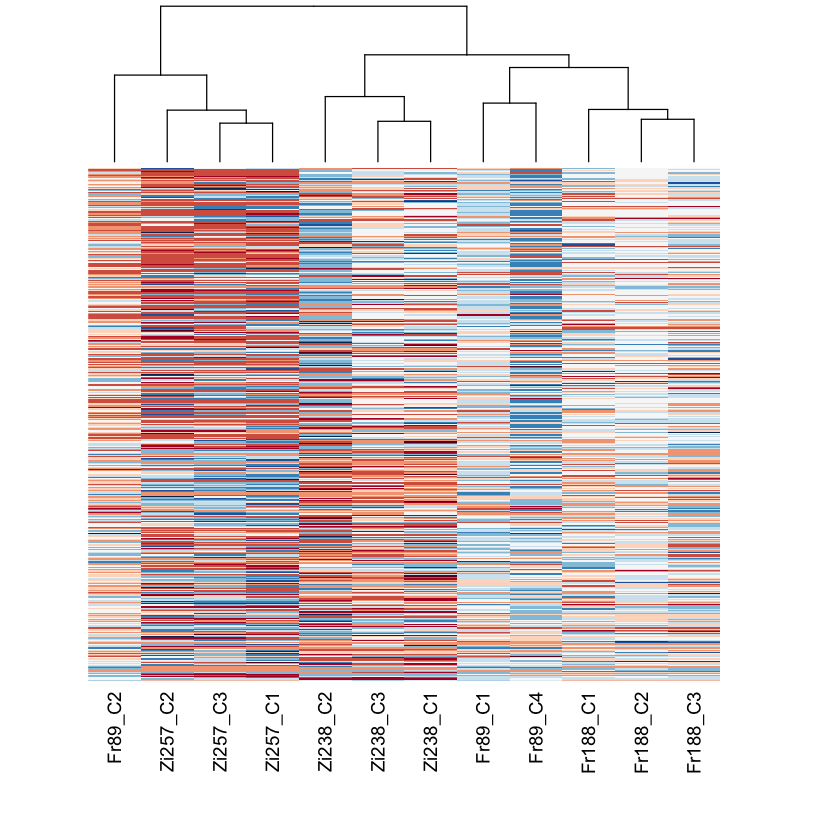

In [131]:
vstC<-varianceStabilizingTransformation(ddsC, blind=TRUE)

hmcol <- brewer.pal(11,'RdBu')
#nCountsC <- counts(ddsC, normalized=TRUE)
heatmap(as.matrix(assay(vstC)[rownames(results.line.ordered.C)[1:length(NoNAC[NoNAC$padj<.05,][,1])], ]), 
        Rowv = NA, 
        col = hmcol, 
        mar = c(8,2), 
        labRow = "")

<a id='TestesLRT'></a>

We do the same for the testes data (there are 150 genes w/ transcripts <.05), and we see some clustering by line. Here Zi238 looks closer to Fr188.  Fr89 and Zi257 are also pretty tight.  This is not the same pattern as we see in the carcass data, but still we see high intra-population variation with comparison to inter-population variation (89 closest to 257, 188 closest to 238).

<a id='heatmapT'></a>

[1] 150

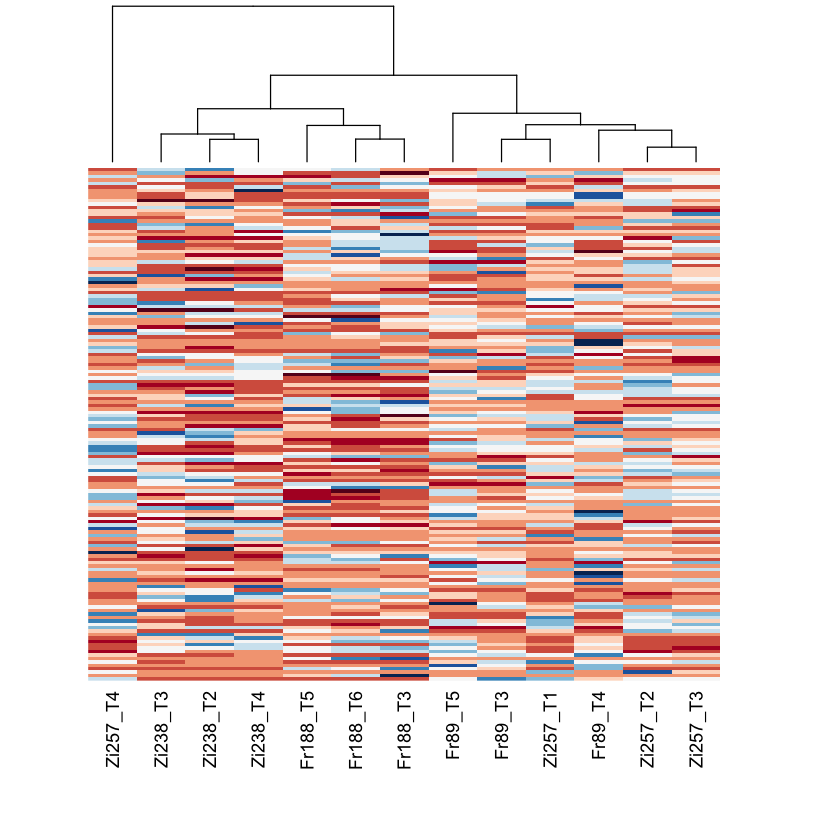

In [80]:
NoNAT<-results.line.ordered.T[complete.cases(results.line.ordered.T$padj),]
length(NoNAT[NoNAT$padj<.05,][,1])

hmcol <- brewer.pal(11,'RdBu')
nCountsT <- counts(ddsT, normalized=TRUE)
heatmap(as.matrix(nCountsT[rownames(results.line.ordered.T)[1:length(NoNAT[NoNAT$padj<.05,][,1])], ]), 
        Rowv = NA, col = hmcol, mar = c(8,2), labRow="")

Now, with rlog transformation of count data.  In this case things map more cleanly by line.

<a id='heatmapTrlog'></a>

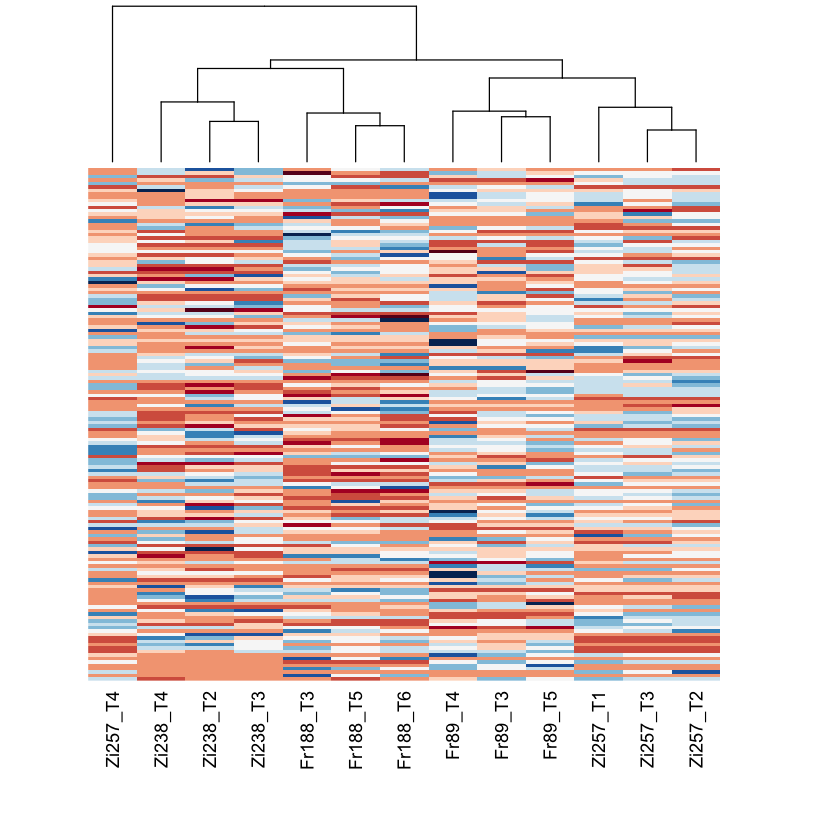

In [132]:
rldT<-rlogTransformation(ddsT, blind=TRUE)

hmcol <- brewer.pal(11,'RdBu')

heatmap(as.matrix(assay(rldT)[rownames(results.line.ordered.T)[1:length(NoNAT[NoNAT$padj<.05,][,1])], ]), 
        Rowv = NA, 
        col = hmcol, 
        mar = c(8,2), 
        labRow = "")

Now with variance stabilizing transformation of count data -- gives us same result as rlog transform.
<a id='heatmapTvst'></a>

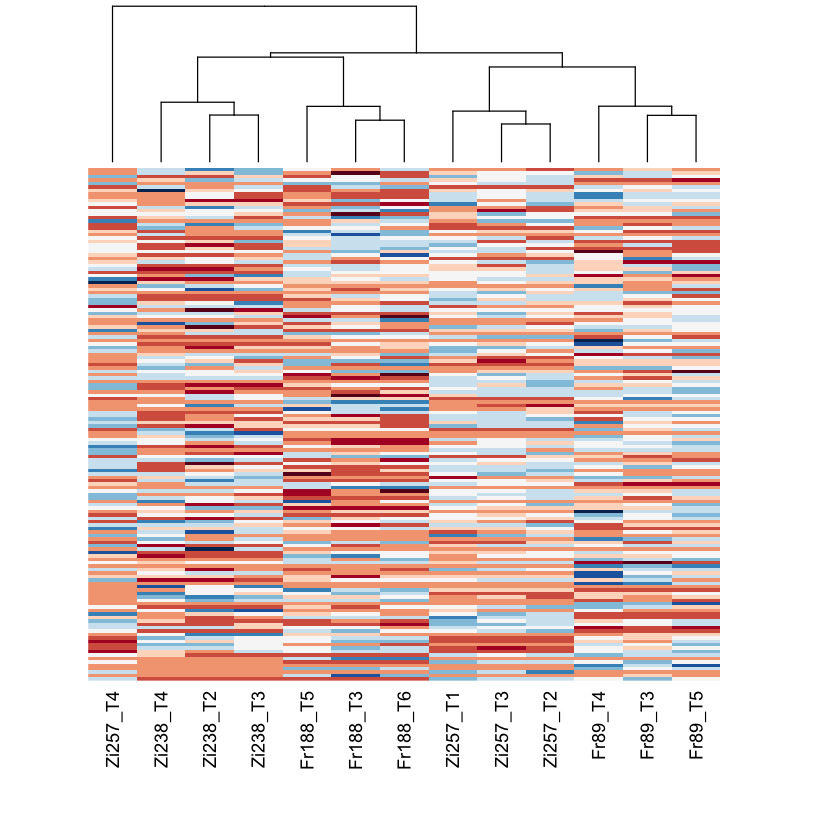

In [133]:
vstT<-varianceStabilizingTransformation(ddsT, blind=TRUE)

hmcol <- brewer.pal(11,'RdBu')

heatmap(as.matrix(assay(vstT)[rownames(results.line.ordered.T)[1:length(NoNAT[NoNAT$padj<.05,][,1])], ]), 
        Rowv = NA, 
        col = hmcol, 
        mar = c(8,2), 
        labRow = "")

We talked about being more stringent in removing outliers (the other strain that potentially looked like an outlier in the python EDA was Fr188_T3), but it seems like Fr188_T3 falls where it's supposed to.

Combining testes and carcass data into one heatmap (this visual shows just how different gene expression is in carcass vs testes data).  [Should be improved by a rlog regularization, probably non-blind, conditional on tissue] <a id='CarcassVsTestesHeatmap'></a>

In [81]:
datasetBoth <- DESeqDataSetFromMatrix(countData = countData,
                                   colData = colData,
                                   design = ~lines)
                                   
#Not sure if design should actually be design=~lines + tissue + lines:tissue?                                   
                                   
ddsBoth<-DESeq(datasetBoth)

estimating size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing
-- replacing outliers and refitting for 874 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)
estimating dispersions
fitting model and testing


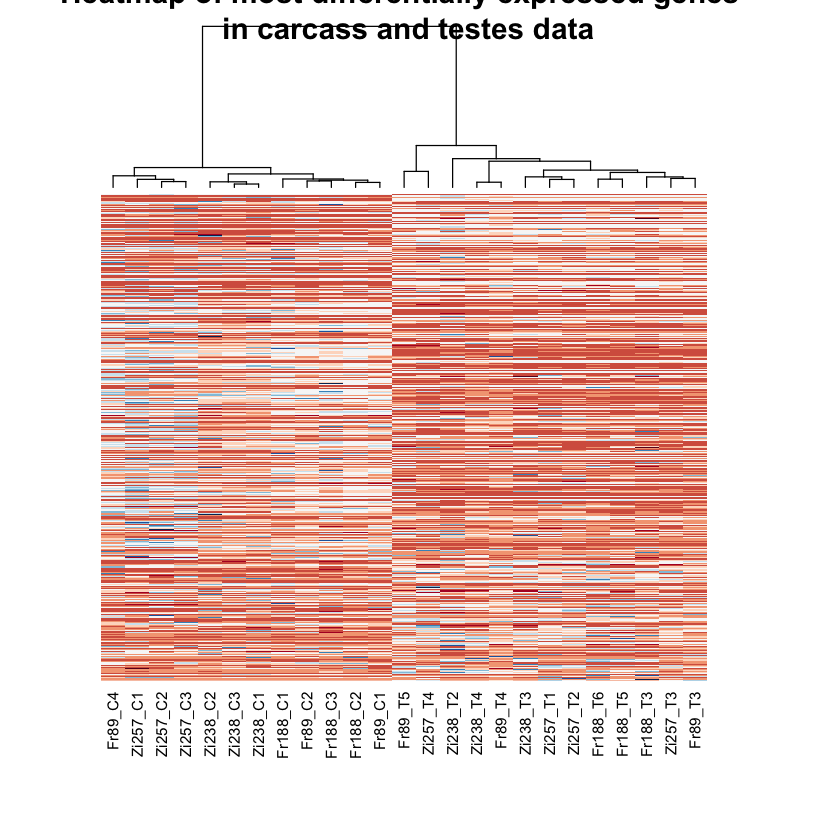

In [82]:
hmcol <- brewer.pal(11,'RdBu')
nCountsBoth <- counts(ddsBoth, normalized=TRUE)
SigsInCandT<-union(rownames(results.line.ordered.T)[1:length(NoNAT[NoNAT$padj<.05,][,1])], 
          rownames(results.line.ordered.C)[1:length(NoNAC[NoNAC$padj<.05,][,1])])


heatmap(as.matrix(nCountsBoth[SigsInCandT, ]), 
        Rowv = NA, col = hmcol, mar = c(8,2), labRow="", main = "Heatmap of most differentially expressed genes \n in carcass and testes data")

Now we plot a PCA using the 463 most differentially expressed genes by line for the carcass data.  Looks like PCA2 maybe shows a country effect, but I'm not all that convinced. 
<a id='CarcassPCA'></a>

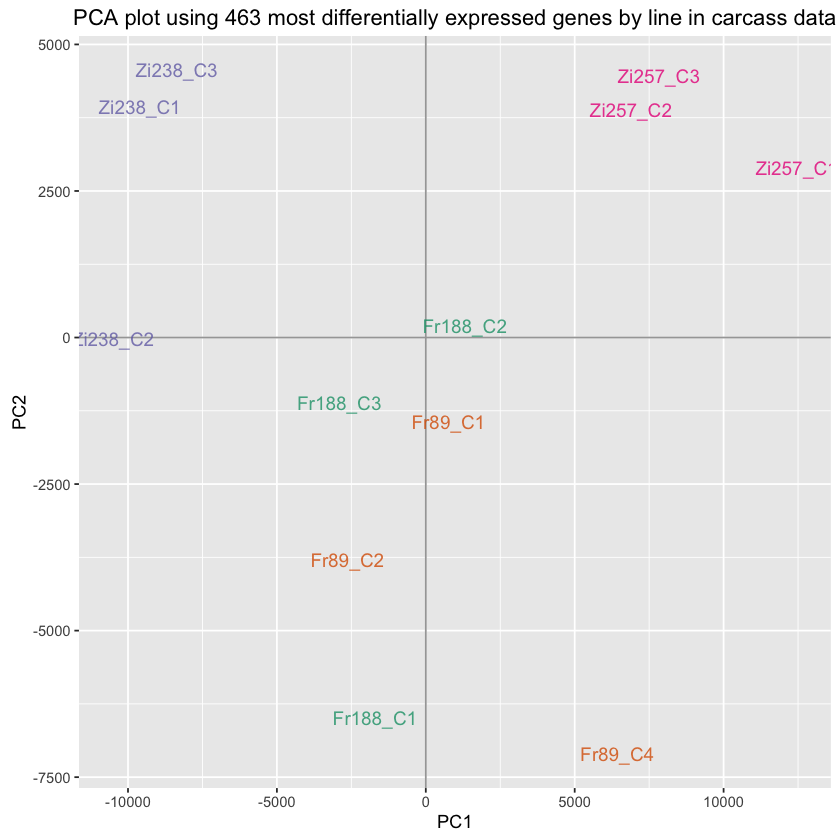

In [83]:
#library(RColorBrewer)
#display.brewer.all()
#brewer.pal(4, "Dark2")

#get normalized counts
pca1<-prcomp(t(as.matrix(nCountsC[rownames(results.line.ordered.C)[1:463], ])))
scores = as.data.frame(pca1$x)


cols=c(rep('#1B9E77',3), rep('#D95F02',3),rep('#7570B3',3),rep('#E7298A',3))
# plot of observations
ggplot(data = scores, aes(x = PC1, y = PC2, label = rownames(scores))) +
  geom_hline(yintercept = 0, colour = "gray65") +
  geom_vline(xintercept = 0, colour = "gray65") +
  geom_text(colour =cols, alpha = 0.8, size = 4) +
  ggtitle("PCA plot using 463 most differentially expressed genes by line in carcass data")

Now we do a PCA plot with the regularized log data.  We see a similar result.
<a id='CarcassPCArlog'></a>

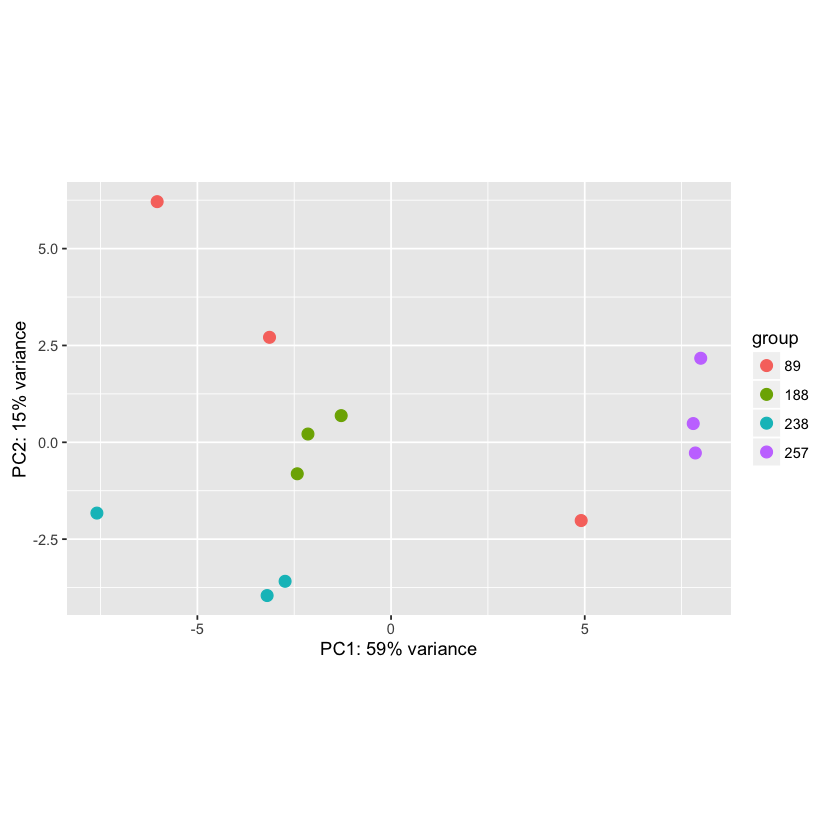

In [134]:
plotPCA(rldC[rownames(results.line.ordered.C)[1:463],], intgroup="lines")

We do the same for testes data.  A plot of PC1 vs PC2 just shows one point (Zi257_T4) as an outlier.  A plot of PC2 vs PC3 reveals clustering by line, but not with the same patterns as in the carcass data (Fr188 for example not close to Fr89).
<a id='TestesPCA'></a>

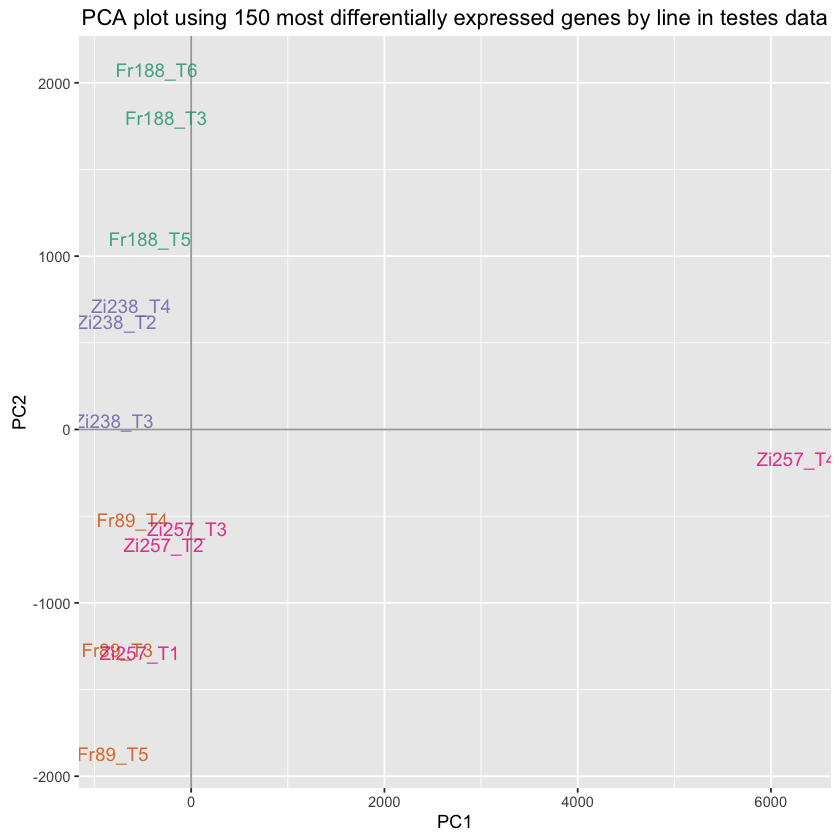

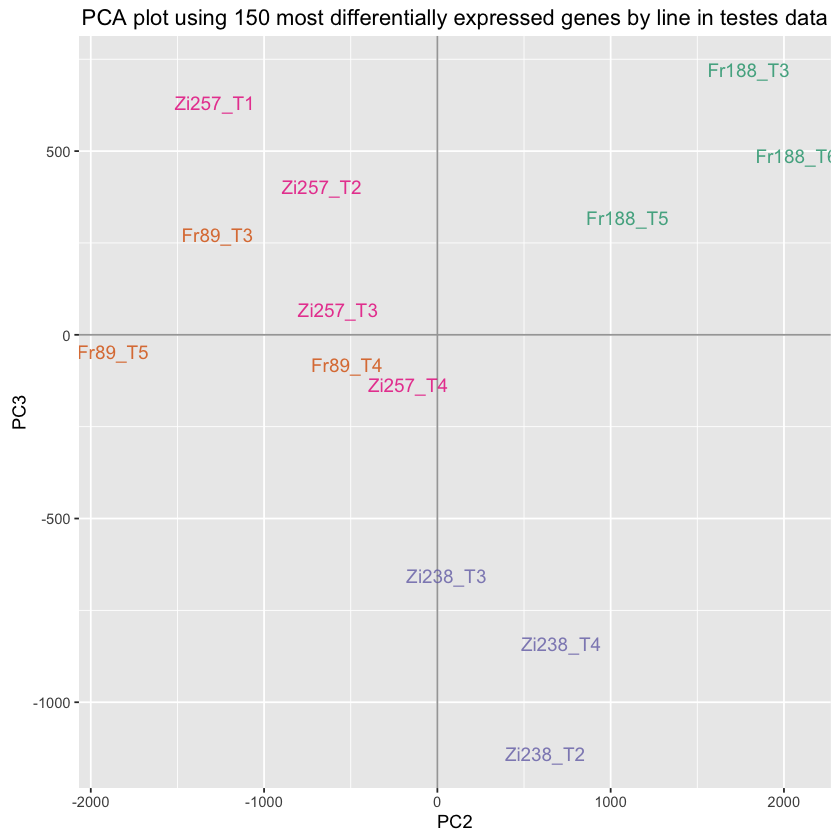

In [84]:
#get normalized counts
pca1<-prcomp(t(as.matrix(nCountsT[rownames(results.line.ordered.T)[1:150], ])))
scores = data.frame(pca1$x)
cols=c(rep('#1B9E77',3), rep('#D95F02',3),rep('#7570B3',3),rep('#E7298A',4))

# plot of observations
ggplot(data = scores, aes(x = PC1, y = PC2, label = rownames(scores))) +
  geom_hline(yintercept = 0, colour = "gray65") +
  geom_vline(xintercept = 0, colour = "gray65") +
  geom_text(alpha = 0.8, size = 4, colour=cols) +
  ggtitle("PCA plot using 150 most differentially expressed genes by line in testes data")

ggplot(data = scores, aes(x = PC2, y = PC3, label = rownames(scores))) +
  geom_hline(yintercept = 0, colour = "gray65") +
  geom_vline(xintercept = 0, colour = "gray65") +
  geom_text(alpha = 0.8, size = 4, colour=cols) +
  ggtitle("PCA plot using 150 most differentially expressed genes by line in testes data")


A PCA plot with rlog transform of testes data.  This PCA plot is much better in terms of showing clusters by line, but still no country effect visible.

<a id='TestesPCArlog'></a>

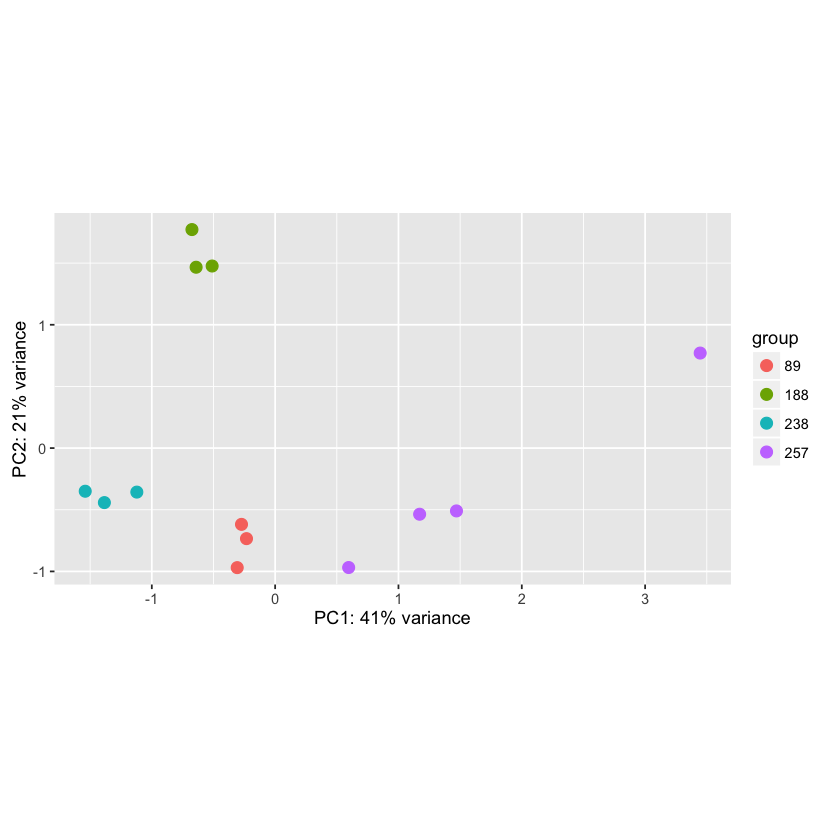

In [136]:
plotPCA(rldT[rownames(results.line.ordered.T)[1:150],], intgroup="lines")

PCA plot along all genes that were differentially expressed in carcass and testes data (shows how different they are).  [Again, rlog transformation should happen]
<a id='CarcassVsTestesPCA'></a>

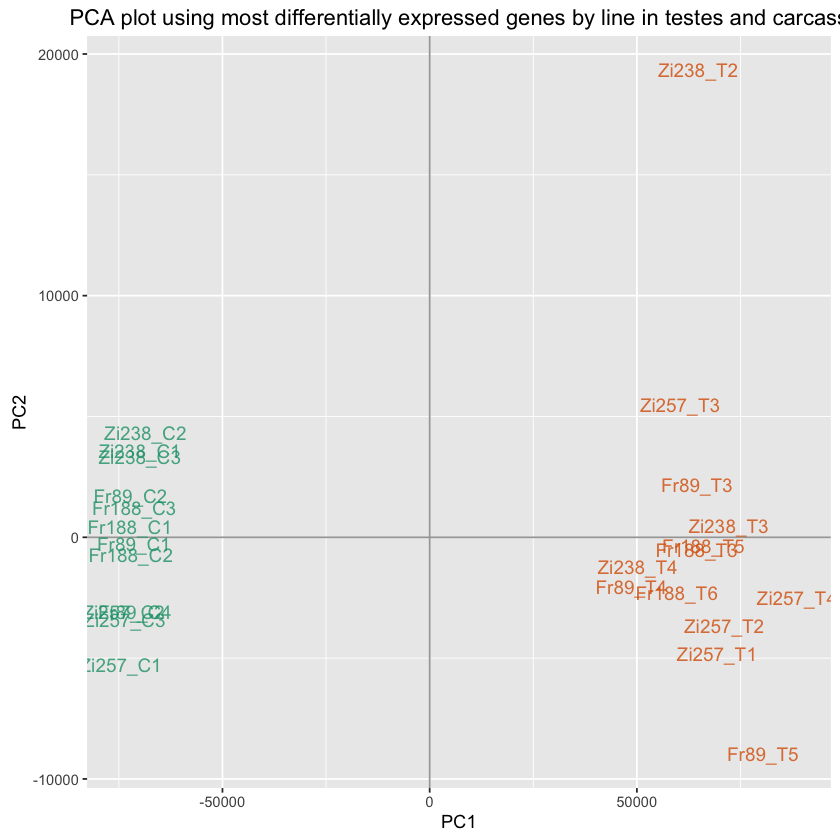

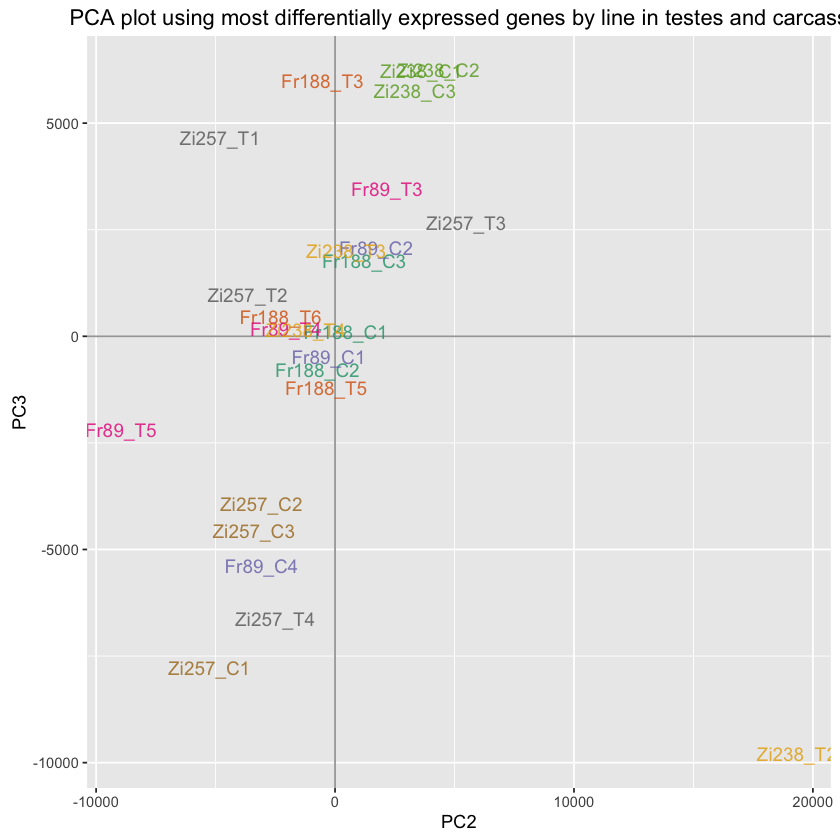

In [85]:
#library(RColorBrewer)
#display.brewer.all()
#brewer.pal(8, "Dark2")

cols=c(rep('#1B9E77',3), rep('#D95F02',3), rep('#1B9E77',3),rep('#D95F02',3),
      rep('#1B9E77',3), rep('#D95F02',3), rep('#1B9E77',3),rep('#D95F02',4))

#get normalized counts
pca1<-prcomp(t(as.matrix(nCountsBoth[SigsInCandT, ])))
scores = as.data.frame(pca1$x)

# plot of observations
ggplot(data = scores, aes(x = PC1, y = PC2, label = rownames(scores))) +
  geom_hline(yintercept = 0, colour = "gray65") +
  geom_vline(xintercept = 0, colour = "gray65") +
  geom_text(colour =cols, alpha = 0.8, size = 4) +
  ggtitle("PCA plot using most differentially expressed genes by line in testes and carcass")


cols=c(rep('#1B9E77',3), rep('#D95F02',3), rep('#7570B3',3),rep('#E7298A',3),
      rep('#66A61E',3), rep('#E6AB02',3), rep('#A6761D',3),rep('#666666',4))


# plot of observations
ggplot(data = scores, aes(x = PC2, y = PC3, label = rownames(scores))) +
  geom_hline(yintercept = 0, colour = "gray65") +
  geom_vline(xintercept = 0, colour = "gray65") +
  geom_text(colour =cols, alpha = 0.8, size = 4) +
  ggtitle("PCA plot using most differentially expressed genes by line in testes and carcass")



# Is there a country effect?

Let's take our carcass data, and calculate average number of misclassifications using k-means with k=2.  

In [140]:
NUM_BOOTSTRAPS=10000

SigCarcassFr188<-nCountsC[rownames(results.line.ordered.C)[1:463], c("Fr188_C1","Fr188_C2", "Fr188_C3")]
SigCarcassFr89<-nCountsC[rownames(results.line.ordered.C)[1:463], c("Fr89_C1","Fr89_C2", "Fr89_C4")]
SigCarcassZi238<-nCountsC[rownames(results.line.ordered.C)[1:463], c("Zi238_C1","Zi238_C2", "Zi238_C3")]
SigCarcassZi257<-nCountsC[rownames(results.line.ordered.C)[1:463], c("Zi257_C1","Zi257_C2", "Zi257_C3")]

#head(cbind(SigCarcassFr188, SigCarcassFr89))
print("Fr188 vs 89")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Fr188vs89<-kmeans(t(cbind(SigCarcassFr188, SigCarcassFr89)[sample(1:463, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Fr188",3), rep("Fr89",3)),Fr188vs89$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 6-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Fr188To89<-mean(numMisclassifiedList)
print(Fr188To89)

print("Fr188 vs Zi238")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Fr188vsZi238<-kmeans(t(cbind(SigCarcassFr188, SigCarcassZi238)[sample(1:463, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Fr188",3), rep("Zi238",3)),Fr188vsZi238$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 6-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Fr188ToZi238<-mean(numMisclassifiedList)
print(Fr188ToZi238)

print("Fr188 vs Zi257")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Fr188vsZi257<-kmeans(t(cbind(SigCarcassFr188, SigCarcassZi257)[sample(1:463, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Fr188",3), rep("Zi257",3)),Fr188vsZi257$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 6-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Fr188ToZi257<-mean(numMisclassifiedList)
print(Fr188ToZi257)

print("Fr89 vs Zi238")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Fr89vsZi238<-kmeans(t(cbind(SigCarcassFr89, SigCarcassZi238)[sample(1:463, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Fr89",3), rep("Zi238",3)),Fr89vsZi238$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 6-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Fr89ToZi238<-mean(numMisclassifiedList)
print(Fr89ToZi238)

print("Fr89 vs Zi257")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Fr89vsZi257<-kmeans(t(cbind(SigCarcassFr89, SigCarcassZi257)[sample(1:463, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Fr89",3), rep("Zi257",3)),Fr89vsZi257$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 6-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Fr89ToZi257<-mean(numMisclassifiedList)
print(Fr89ToZi257)

print("Zi238 vs 257")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Zi238vsZi257<-kmeans(t(cbind(SigCarcassZi238, SigCarcassZi257)[sample(1:463, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Zi238",3), rep("Zi257",3)),Zi238vsZi257$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 6-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Zi238ToZi257<-mean(numMisclassifiedList)
print(Zi238ToZi257)

[1] "Fr188 vs 89"
[1] 1.9274
[1] "Fr188 vs Zi238"
[1] 0.0125
[1] "Fr188 vs Zi257"
[1] 0.0474
[1] "Fr89 vs Zi238"
[1] 0.141
[1] "Fr89 vs Zi257"
[1] 0.4454
[1] "Zi238 vs 257"
[1] 0


Next we draw a network with the results.  Why did we not do a correlation matrix from the get go?

,from,to,thickness
1,Fr188,Fr89,3.854
2,Fr188,Zi238,0.028
3,Fr188,Zi257,0.092
4,Fr89,Zi238,0.262
5,Fr89,Zi257,0.928
6,Zi238,Zi257,0.002


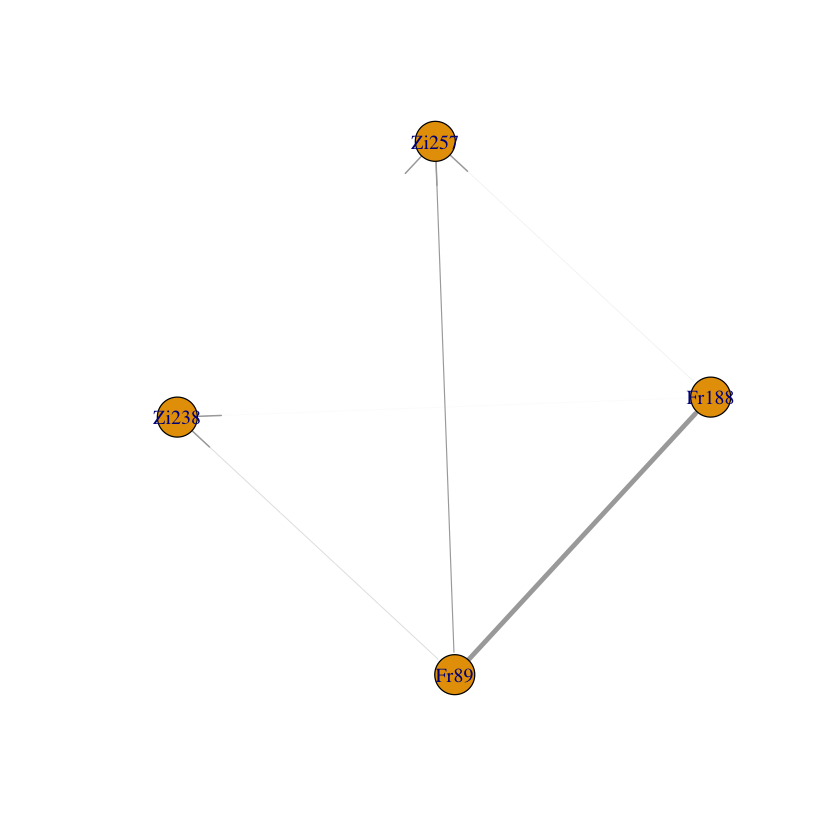

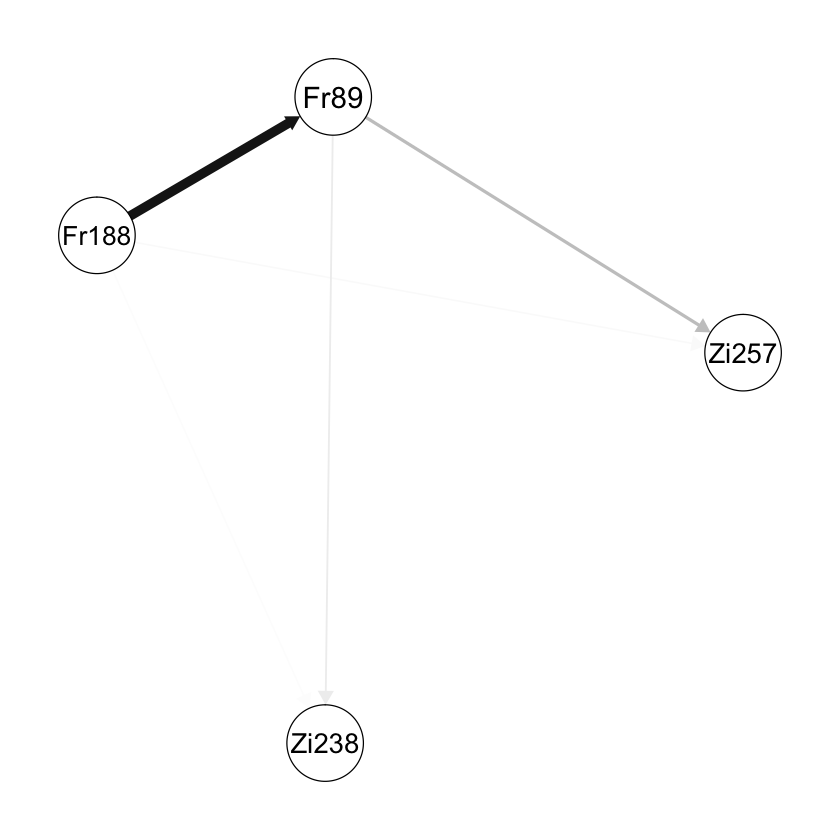

In [87]:
Edges <- data.frame(
    from = c("Fr188","Fr188","Fr188","Fr89", "Fr89", "Zi238"),
    to = c("Fr89", "Zi238", "Zi257", "Zi238","Zi257","Zi257"),
    thickness = (c(Fr188To89,Fr188ToZi238, Fr188ToZi257, Fr89ToZi238,Fr89ToZi257, Zi238ToZi257)+.001)*2)

#Edges <- subset(Edges,from!=to)

library("igraph")
g <- graph.edgelist(as.matrix(Edges[,-3]))
l <- layout.fruchterman.reingold(g)
# Define edge widths:
E(g)$width <- Edges$thickness 
E(g)$arrow.width <- 0
plot(g,layout=l)

library("qgraph")
qgraph(Edges,gray=TRUE)

K-means is very sensitive to Euclidean distance.  We apply the rlog transform to the data for better results.

In [109]:
#assay(vstC)[rownames(results.line.ordered.C)[1:463], c("Fr188_C1","Fr188_C2", "Fr188_C3")]

NUM_BOOTSTRAPS=10000

SigCarcassFr188<-assay(rdlC)[rownames(results.line.ordered.C)[1:463], c("Fr188_C1","Fr188_C2", "Fr188_C3")]
SigCarcassFr89<-assay(rdlC)[rownames(results.line.ordered.C)[1:463], c("Fr89_C1","Fr89_C2", "Fr89_C4")]
SigCarcassZi238<-assay(rdlC)[rownames(results.line.ordered.C)[1:463], c("Zi238_C1","Zi238_C2", "Zi238_C3")]
SigCarcassZi257<-assay(rdlC)[rownames(results.line.ordered.C)[1:463], c("Zi257_C1","Zi257_C2", "Zi257_C3")]

#head(cbind(SigCarcassFr188, SigCarcassFr89))
print("Fr188 vs 89")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Fr188vs89<-kmeans(t(cbind(SigCarcassFr188, SigCarcassFr89)[sample(1:463, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Fr188",3), rep("Fr89",3)),Fr188vs89$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 6-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Fr188To89<-mean(numMisclassifiedList)
print(Fr188To89)

print("Fr188 vs Zi238")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Fr188vsZi238<-kmeans(t(cbind(SigCarcassFr188, SigCarcassZi238)[sample(1:463, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Fr188",3), rep("Zi238",3)),Fr188vsZi238$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 6-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Fr188ToZi238<-mean(numMisclassifiedList)
print(Fr188ToZi238)

print("Fr188 vs Zi257")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Fr188vsZi257<-kmeans(t(cbind(SigCarcassFr188, SigCarcassZi257)[sample(1:463, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Fr188",3), rep("Zi257",3)),Fr188vsZi257$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 6-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Fr188ToZi257<-mean(numMisclassifiedList)
print(Fr188ToZi257)

print("Fr89 vs Zi238")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Fr89vsZi238<-kmeans(t(cbind(SigCarcassFr89, SigCarcassZi238)[sample(1:463, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Fr89",3), rep("Zi238",3)),Fr89vsZi238$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 6-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Fr89ToZi238<-mean(numMisclassifiedList)
print(Fr89ToZi238)

print("Fr89 vs Zi257")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Fr89vsZi257<-kmeans(t(cbind(SigCarcassFr89, SigCarcassZi257)[sample(1:463, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Fr89",3), rep("Zi257",3)),Fr89vsZi257$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 6-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Fr89ToZi257<-mean(numMisclassifiedList)
print(Fr89ToZi257)

print("Zi238 vs 257")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Zi238vsZi257<-kmeans(t(cbind(SigCarcassZi238, SigCarcassZi257)[sample(1:463, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Zi238",3), rep("Zi257",3)),Zi238vsZi257$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 6-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Zi238ToZi257<-mean(numMisclassifiedList)
print(Zi238ToZi257)

[1] "Fr188 vs 89"
[1] 1.2828
[1] "Fr188 vs Zi238"
[1] 0.0146
[1] "Fr188 vs Zi257"
[1] 0
[1] "Fr89 vs Zi238"
[1] 0.9245
[1] "Fr89 vs Zi257"
[1] 0.9907
[1] "Zi238 vs 257"
[1] 0


We represent this as a network.  Once again this is rlog transformed carcass data that we have conducted our bootstrap k-means analysis on.

<a id='CrlogBootstrap'></a>



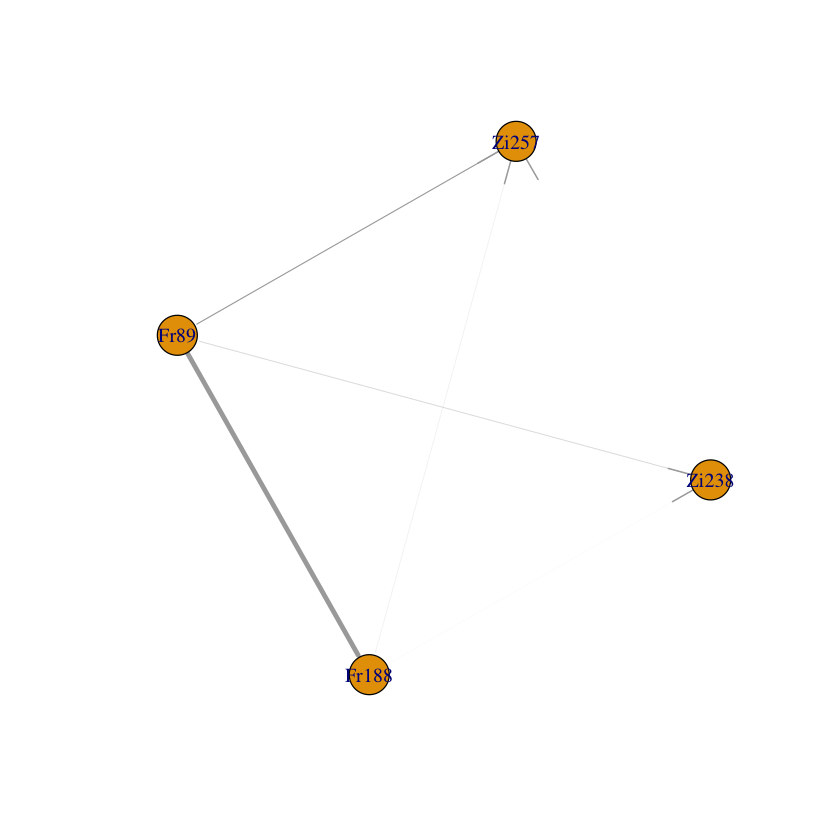

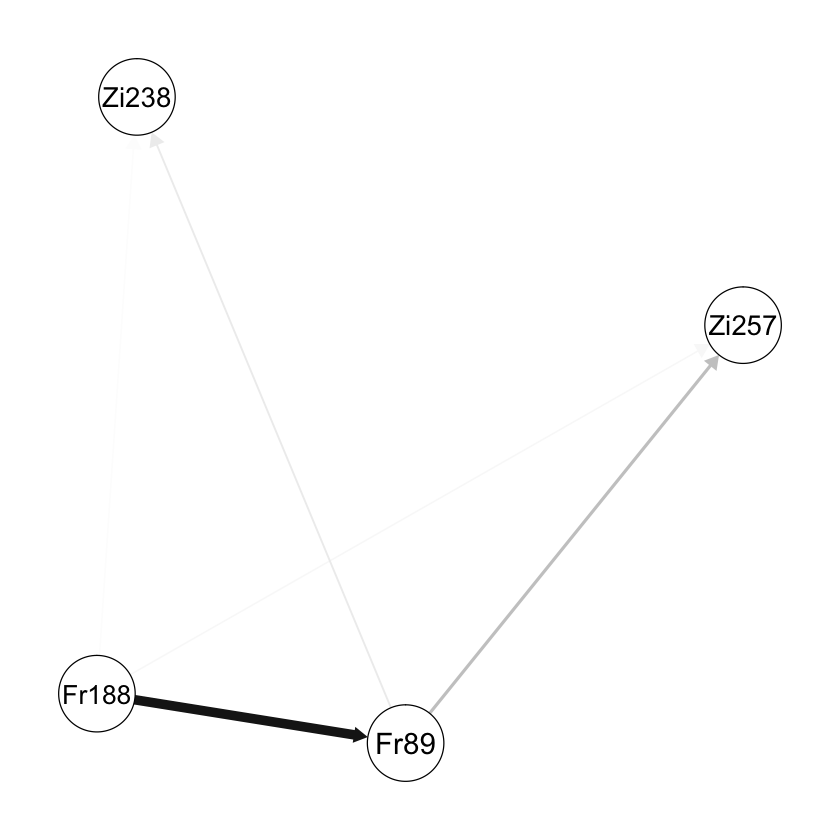

In [141]:
Edges <- data.frame(
    from = c("Fr188","Fr188","Fr188","Fr89", "Fr89", "Zi238"),
    to = c("Fr89", "Zi238", "Zi257", "Zi238","Zi257","Zi257"),
    thickness = (c(Fr188To89,Fr188ToZi238, Fr188ToZi257, Fr89ToZi238,Fr89ToZi257, Zi238ToZi257)+.001)*2)

#Edges <- subset(Edges,from!=to)

library("igraph")
g <- graph.edgelist(as.matrix(Edges[,-3]))
l <- layout.fruchterman.reingold(g)
# Define edge widths:
E(g)$width <- Edges$thickness 
E(g)$arrow.width <- 0
plot(g,layout=l)

library("qgraph")
qgraph(Edges,gray=TRUE)

Distance matrix for no particular reason.  Just an alternative to thinking about visualizing differences.  (Why not a covariance matrix too?)

In [138]:
sampleDists<-dist(t(assay(rldC)[rownames(results.line.ordered.C)[1:463],]))
sampleDistMatrix <- as.matrix(sampleDists)
head(sampleDistMatrix)
#rownames(sampleDistMatrix) <- paste(rld$condition, rld$type, sep="-")
#head(sampleDistMatrix)
#colnames(sampleDistMatrix) <- NULL
#colors <- colorRampPalette( rev(brewer.pal(9, "Blues")) )(255)
#heatmap(sampleDistMatrix,
#         clustering_distance_rows=sampleDists,
#         clustering_distance_cols=sampleDists,
#         col=colors)

,Fr188_C1,Fr188_C2,Fr188_C3,Fr89_C1,Fr89_C2,Fr89_C4,Zi238_C1,Zi238_C2,Zi238_C3,Zi257_C1,Zi257_C2,Zi257_C3
Fr188_C1,0.000000,4.482239,5.285884,6.964846,9.533838,9.750359,6.919637,8.842363,6.715168,12.154018,11.854450,11.683884
Fr188_C2,4.482239,0.000000,4.277908,6.657449,9.190003,9.260241,7.817419,9.533434,7.162126,10.724935,10.841729,10.412327
Fr188_C3,5.285884,4.277908,0.000000,7.140025,10.016657,9.771918,8.092912,9.364762,7.420586,11.861179,11.992565,11.492216
Fr89_C1,6.964846,6.657449,7.140025,0.000000,10.392142,6.164789,7.669575,8.266098,7.714932,12.051749,12.286768,11.944403
Fr89_C2,9.533838,9.190003,10.016657,10.392142,0.000000,14.551303,10.242805,14.172231,9.992282,8.101977,7.517024,7.090421
Fr89_C4,9.750359,9.260241,9.771918,6.164789,14.551303,0.000000,10.933134,9.106158,10.727724,15.008424,15.676935,15.296805


We do the same thing with testes data.  We see very little overlap between countries.  For testes, Zi257 has more replicate data points, so any Zi257 - ????? comparison will have on average more misclassified points.  Just something to be aware of.

<a id='TrlogBootstrap'></a>

In [161]:
NUM_BOOTSTRAPS=10000

SigTestesFr188<-assay(rldT)[rownames(results.line.ordered.T)[1:150], c("Fr188_T3","Fr188_T5", "Fr188_T6")]
SigTestesFr89<-assay(rldT)[rownames(results.line.ordered.T)[1:150], c("Fr89_T3","Fr89_T4", "Fr89_T5")]
SigTestesZi238<-assay(rldT)[rownames(results.line.ordered.T)[1:150], c("Zi238_T2","Zi238_T3", "Zi238_T4")]
SigTestesZi257<-assay(rldT)[rownames(results.line.ordered.T)[1:150], c("Zi257_T1","Zi257_T2", "Zi257_T3", "Zi257_T4")]

#head(cbind(SigCarcassFr188, SigCarcassFr89))
print("Fr188 vs 89")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Fr188vs89<-kmeans(t(cbind(SigTestesFr188, SigTestesFr89)[sample(1:150, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Fr188",3), rep("Fr89",3)),Fr188vs89$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 6-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Fr188To89<-mean(numMisclassifiedList)
print(Fr188To89)

print("Fr188 vs Zi238")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Fr188vsZi238<-kmeans(t(cbind(SigTestesFr188, SigTestesZi238)[sample(1:150, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Fr188",3), rep("Zi238",3)),Fr188vsZi238$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 6-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Fr188ToZi238<-mean(numMisclassifiedList)
print(Fr188ToZi238)

print("Fr188 vs Zi257")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Fr188vsZi257<-kmeans(t(cbind(SigTestesFr188, SigTestesZi257)[sample(1:150, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Fr188",3), rep("Zi257",4)),Fr188vsZi257$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 7-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Fr188ToZi257<-mean(numMisclassifiedList)
print(Fr188ToZi257)

print("Fr89 vs Zi238")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Fr89vsZi238<-kmeans(t(cbind(SigTestesFr89, SigTestesZi238)[sample(1:150, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Fr89",3), rep("Zi238",3)),Fr89vsZi238$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 6-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Fr89ToZi238<-mean(numMisclassifiedList)
print(Fr89ToZi238)

print("Fr89 vs Zi257")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Fr89vsZi257<-kmeans(t(cbind(SigTestesFr89, SigTestesZi257)[sample(1:150, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Fr89",3), rep("Zi257",4)),Fr89vsZi257$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 7-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Fr89ToZi257<-mean(numMisclassifiedList)
print(Fr89ToZi257)

print("Zi238 vs 257")
numMisclassifiedList=c()
for(i in 1:NUM_BOOTSTRAPS){
    Zi238vsZi257<-kmeans(t(cbind(SigTestesZi238, SigTestesZi257)[sample(1:150, replace=TRUE),]), centers = 2)
    ForAccTable<-table(c(rep("Zi238",3), rep("Zi257",4)),Zi238vsZi257$cluster)
    numMisclassified<-min(sum(diag(ForAccTable)), 7-sum(diag(ForAccTable)))
    numMisclassifiedList<-c(numMisclassifiedList, numMisclassified)
}
Zi238ToZi257<-mean(numMisclassifiedList)
print(Zi238ToZi257)

[1] "Fr188 vs 89"
[1] 0
[1] "Fr188 vs Zi238"
[1] 0.0031
[1] "Fr188 vs Zi257"
[1] 0.7258
[1] "Fr89 vs Zi238"
[1] 0.0117
[1] "Fr89 vs Zi257"
[1] 1.4629
[1] "Zi238 vs 257"
[1] 0.7878


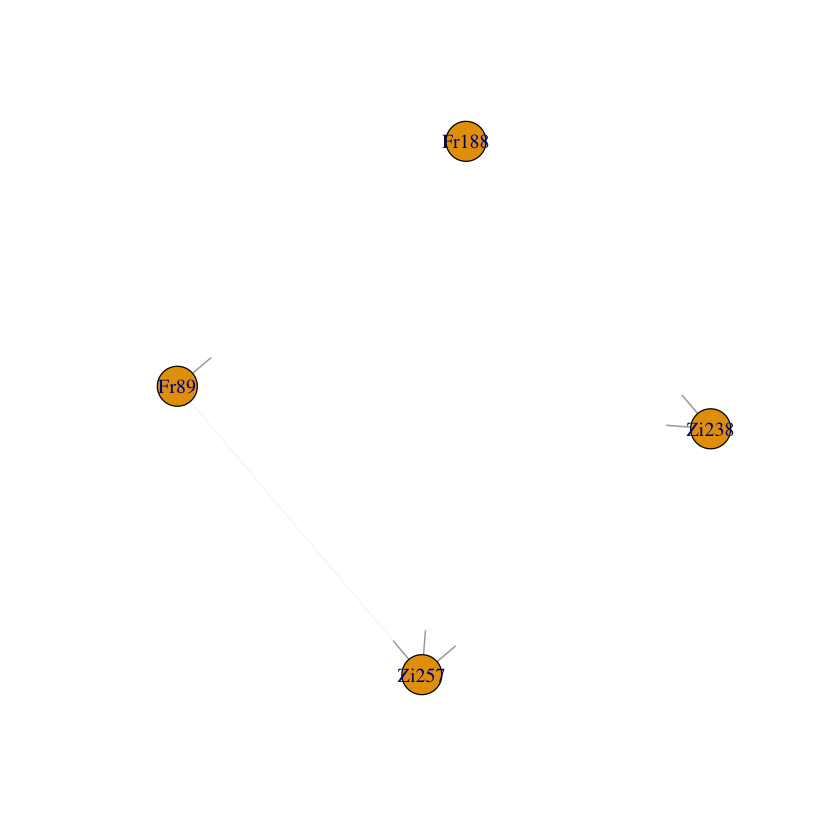

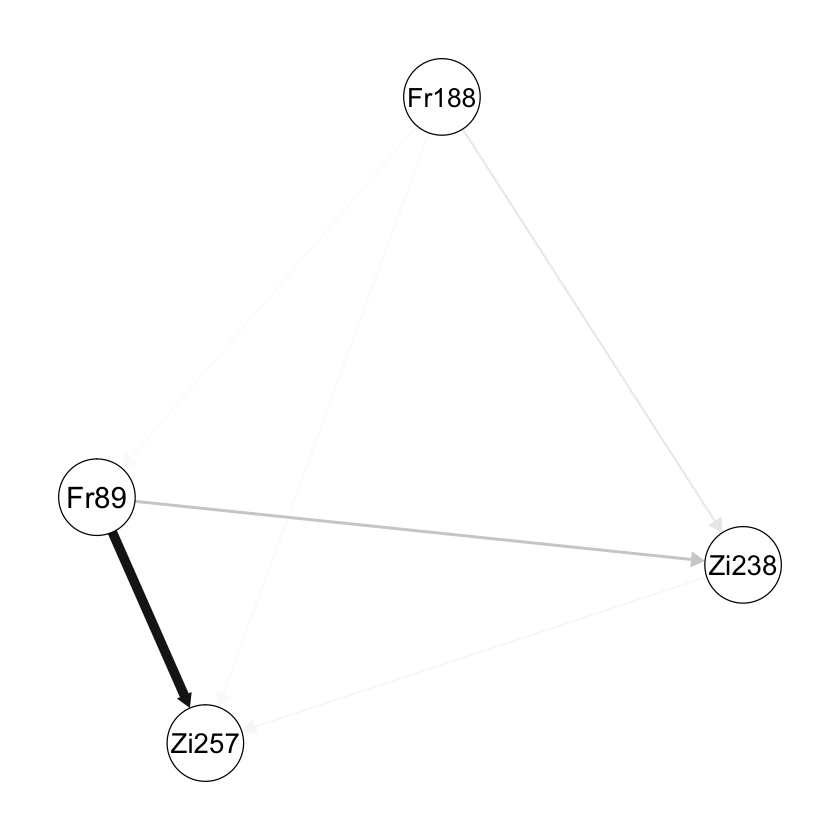

In [151]:
Edges <- data.frame(
    from = c("Fr188","Fr188","Fr188","Fr89", "Fr89", "Zi238"),
    to = c("Fr89", "Zi238", "Zi257", "Zi238","Zi257","Zi257"),
    thickness = (c(Fr188To89,Fr188ToZi238, Fr188ToZi257, Fr89ToZi238,Fr89ToZi257, Zi238ToZi257)+.001)*2)

#Edges <- subset(Edges,from!=to)

library("igraph")
g <- graph.edgelist(as.matrix(Edges[,-3]))
l <- layout.fruchterman.reingold(g)
# Define edge widths:
E(g)$width <- Edges$thickness 
E(g)$arrow.width <- 0
plot(g,layout=l)

library("qgraph")
qgraph(Edges,gray=TRUE)

# Comparing found DE genes (in carcass data) to Sackton GBE meta-analysis YRV genes

### Grabbing and updating Sackton GBE genes

The supplementary material of the Sackton GBE meta-analysis is linked here: "http://gbe.oxfordjournals.org/content/suppl/2013/01/12/evt005.DC1/sup_file_1.tsv".  We load it as a table of `Sacktongenes`

In [28]:
Sacktongenes <- read.table(
  "http://gbe.oxfordjournals.org/content/suppl/2013/01/12/evt005.DC1/sup_file_1.tsv",
  sep="\t", header=TRUE)


In [29]:
head(Sacktongenes)
length(Sacktongenes[,1])
#There are 4271 genes

,fbgn,chr,sigclass,all.sig,dmel.avg,cv,cellular_loc,dmsp,FbtrLen,NumInt,ellip.h,Lam.Ave.log2.Ratio,Lam.fdr.p,Lam.Target,W5.ct,AT.ct,up.len,max.W,w5.norm,at.norm,geneRT
1,FBgn0000008,2R,specific,1,0.4699436,0.4690499,membrane,no,4.554513,9,⋯,0.164,0.3615637,0,30,542,800,19,0.0375,0.6775,-0.9491809
2,FBgn0000014,3R,none,0,0.4496924,0.1402725,nucleus,no,4.344923,5,⋯,NA,NA,NA,36,507,800,19,0.045,0.63375,-2.693801
3,FBgn0000036,3R,none,0,0.3308644,0.1144212,membrane,no,4.745894,9,⋯,NA,NA,NA,29,487,800,10,0.03625,0.60875,-2.293437
4,FBgn0000038,3L,none,0,0.4913641,0.09915834,membrane,no,3.82256,6,⋯,0.0887,0.6639291,0,21,459,800,15,0.02625,0.57375,2.815207
5,FBgn0000042,X,specific,1,0.7656141,0.2847409,nucleus,no,3.594282,1,⋯,-0.319,0.09635875,0,25,495,800,34,0.03125,0.61875,4.614353
6,FBgn0000043,2R,none,0,0.5226461,0.05774715,intracellular,no,3.249687,1,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,4.23216


[1] 4271

In [30]:
#colnames(Sacktongenes)

Genes for which all.sig==1 are YRV genes.  There are 678 YRV genes.  We display the first 10.  The variable `YRVgenes` is a list of genes described in the Sackton GBE meta-analysis.

In [31]:
YRVgenes<-Sacktongenes[Sacktongenes$all.sig==1,]$fbgn
length(YRVgenes)


[1] 678

These genes might have names that are out of date.  We are going to update the names using flybase.

In [32]:
UpdatedGBEtable<-read.table("~/Downloads/FlyBase_IDs-5.txt", sep="\t")
head(UpdatedGBEtable)

,V1,V2,V3,V4
1,FBgn0037191,FBgn0037191,FBgn0037191,CG14448
2,FBgn0033320,FBgn0033320,FBgn0033320,CG8586
3,FBgn0051156,FBgn0051156,FBgn0051156,CG31156
4,FBgn0039236,FBgn0265266,FBgn0265266,CG13639
5,FBgn0261992,FBgn0261992,FBgn0261992,CG42810
6,FBgn0038220,FBgn0038220,FBgn0038220,CG12207


 In the updated gene names, there are 4279 genes.  Sometimes multiple genes were mapped to 1, and sometimes 1 gene was mapped to multiple.  The new updated genes analyzed are listed in variable `AllUpdatedGBEGenes`

In [33]:
length(UpdatedGBEtable$V1) 
length(unique(UpdatedGBEtable$V1)) 
length(unique(UpdatedGBEtable$V3))
AllUpdatedGBEGenes<-unique(UpdatedGBEtable$V3)

[1] 4285

[1] 4271

[1] 4279

So actually the number of YRV genes is 684 instead of 678.  These are stored in the variable `newYRVgenes`

In [34]:
newYRVgenes<-unique(UpdatedGBEtable[UpdatedGBEtable$V1 %in% YRVgenes, ]$V3)
length(newYRVgenes)
length(YRVgenes)

[1] 684

[1] 678

We now consider nonYRV genes updated from the table in Sackton's GBE paper.  We find there are 3595 of them.  These are stored in the variable `newnonYRVgenes`

In [35]:
nonYRVgenes<-Sacktongenes[Sacktongenes$all.sig==0,]$fbgn
newnonYRVgenes<-unique(UpdatedGBEtable[UpdatedGBEtable$V1 %in% nonYRVgenes, ]$V3)
length(newnonYRVgenes)
length(nonYRVgenes)

[1] 3595

[1] 3593

### Turning back our attention to genes in our analysis

There are 463 transcripts that statisically significantly (adjusted p-val <.05) show differential expression by line in carcass data (according to our analysis in the first section).  

In [36]:
length(NoNAC[NoNAC$padj<.05,][,1])

[1] 463

There are 150 transcripts that are significant in the testes data.  

In [37]:
length(NoNAT[NoNAT$padj<.05,][,1])

[1] 150

If we consider both carcass and testes, there are 607 significant transcripts.  So there are 6 transcripts that are significant both in testes data and carcass data.

In [38]:
length(SigsInCandT)
150+463-607

[1] 607

[1] 6

### Converting transcripts in our analysis to genes

I copy paste the transcripts from all the genes in our analysis into http://flybase.org/static_pages/downloads/IDConv.html. As a result, I get a table of conversions from Fbtr to FBgn stored in file ~/Downloads/FlyBase_IDs-7.txt.  I stored all these genes in `AllUpdatedOurGenes`

In [39]:
UpdatedTranscripts<-read.table("~/Downloads/FlyBase_IDs-7.txt", sep="\t")  #IMPORTANT: I replaced all ' in the table by 0000000000.  If I didn't the table read was messed up
length(unique(UpdatedTranscripts$V1))
length(unique(UpdatedTranscripts$V3))
head(UpdatedTranscripts)

newSigGenesC<-unique(UpdatedTranscripts[UpdatedTranscripts$V1 %in% rownames(NoNAC[NoNAC$padj<.05,]), ]$V3)
newSigGenesT<-unique(UpdatedTranscripts[UpdatedTranscripts$V1 %in% rownames(NoNAT[NoNAT$padj<.05,]), ]$V3)
newSigGenes<-union(newSigGenesC, newSigGenesT)
newUnSigGenesC<-unique(UpdatedTranscripts[UpdatedTranscripts$V1 %in% rownames(NoNAC[NoNAC$padj>=.05,]), ]$V3)
newUnSigGenesT<-unique(UpdatedTranscripts[UpdatedTranscripts$V1 %in% rownames(NoNAT[NoNAT$padj>=.05,]), ]$V3)
newUnSigGenes<-intersect(newUnSigGenesC, newUnSigGenesT)
length(newSigGenes) + length(newUnSigGenes)

#Ther are are a bunch of genes with NA here for p_adj.  What do we do with those?


[1] 30433

[1] 13904

,V1,V2,V3,V4
1,FBtr0302974,FBtr0302974,FBgn0261625,GLS
2,FBtr0335289,FBtr0335289,FBgn0033051,Strica
3,FBtr0344010,FBtr0344010,FBgn0038402,Fer2
4,FBtr0301882,FBtr0301882,FBgn0020440,Fak
5,FBtr0074312,FBtr0074312,FBgn0010412,RpS19a
6,FBtr0335463,FBtr0335463,FBgn0264988,CG44139


[1] 11765

## Combining GBE dataset and Our dataset into Fisher's table

The number of genes in common between the GBE dataset and our dataset are:

Is that more than we would expect by chance?  We need the following pieces of information:
- \# YRVgenes intersect OurDEGenes : 71
- \# YRVgenes intersect !OurDEGenes: 576
- \# !YRVgenes intersect OurDEGenes: 212
- \# !YRVgenes union !OurDEGenes :  3348

In [40]:
AllGBEGenes<-union(newYRVgenes, newnonYRVgenes)
AllOurGenes<-union(newSigGenes, newUnSigGenes)
length(intersect(AllGBEGenes, AllOurGenes))

length(intersect(newYRVgenes, newSigGenes))
length(intersect(newYRVgenes, newUnSigGenes))
length(intersect(newnonYRVgenes, newSigGenes))
length(intersect(newnonYRVgenes, newUnSigGenes))

[1] 4031

[1] 71

[1] 576

[1] 212

[1] 3348

In [41]:
forFishersTest<-matrix(c(71, 212, 576, 3348), nrow = 2, 
                       dimnames = list(c("YRVgenesYes", "YRVgenesNo"),c("OurDEGenesYes", "OurDEGenesNo")))
forFishersTest

,OurDEGenesYes,OurDEGenesNo
YRVgenesYes,71,576
YRVgenesNo,212,3348


In [42]:
fisher.test(forFishersTest, or = 1, alternative = "two.sided", conf.int = TRUE, conf.level = 0.95)


	Fisher's Exact Test for Count Data

data:  forFishersTest
p-value = 1.119e-05
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
 1.444909 2.598058
sample estimates:
odds ratio 
  1.946327 


The p-value is 1.119*10^-5 : we can reject the null of independence in the number of cells in the table at the 1% level 

<a id="FishersExactTest"> </a>